In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
%matplotlib inline

In [2]:
#minha funcao para mostrar as imagens
def imshow(im,big=False):
    if big:
        plt.figure(figsize=(20,20))
    else:
        plt.figure()
    if len(im.shape)<3:
        plt.imshow(im, cmap='gray')#As cores ficam zoadas no Jupyter se deixar sem esse parâmetro
    else:
        plt.imshow(im[:,:,::-1]) 
    plt.axis('off')
    plt.show()

In [3]:
def f2i(im):#float to int
    return np.round(im * 255.0).astype('uint8')
def i2f(im):#int to float
    return im.astype('float') / 255.0
def norm(im):
    return (im-im.min())/(im.max()-im.min())

In [4]:
def coloca_fundo(im,im_fundo,mascara):
    #imagem_com_fundo = im_sem_fundo.copy()
    mascara_tres_eixos = [mascara]*3
    mascara_tres_eixos = np.swapaxes(np.swapaxes(mascara_tres_eixos, 0, 2), 0, 1)

    imagem_com_fundo = np.where(mascara_tres_eixos, im, im_fundo)
    return imagem_com_fundo

### Abre Imagens
img/[0-8].bmp <br>
shrek.jpg   utfpr.jpg

In [5]:
path = "img/1.bmp"
background = "shrek.jpg"

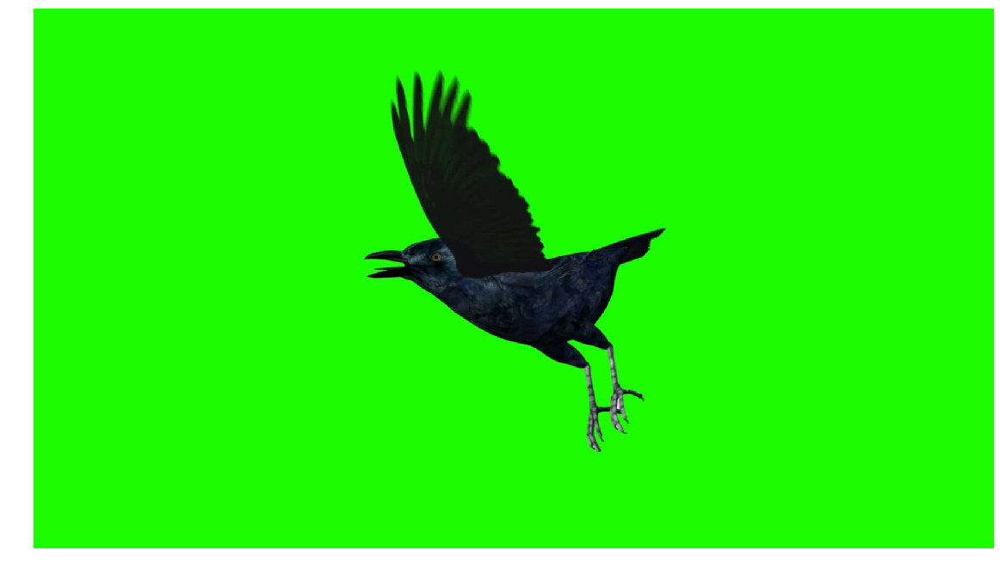

In [6]:
im = cv2.imread(path)
imshow(im, True)

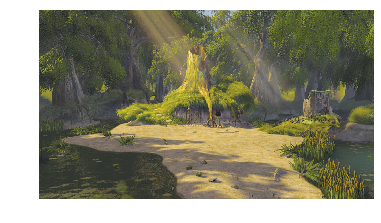

In [7]:
def abre_fundo(path,shape):
    im_fundo = cv2.imread(path)
    im_fundo = cv2.resize(im_fundo, (shape[1], shape[0]))
    return im_fundo
im_fundo = abre_fundo(background,im.shape)
imshow(im_fundo)

### Busca verde

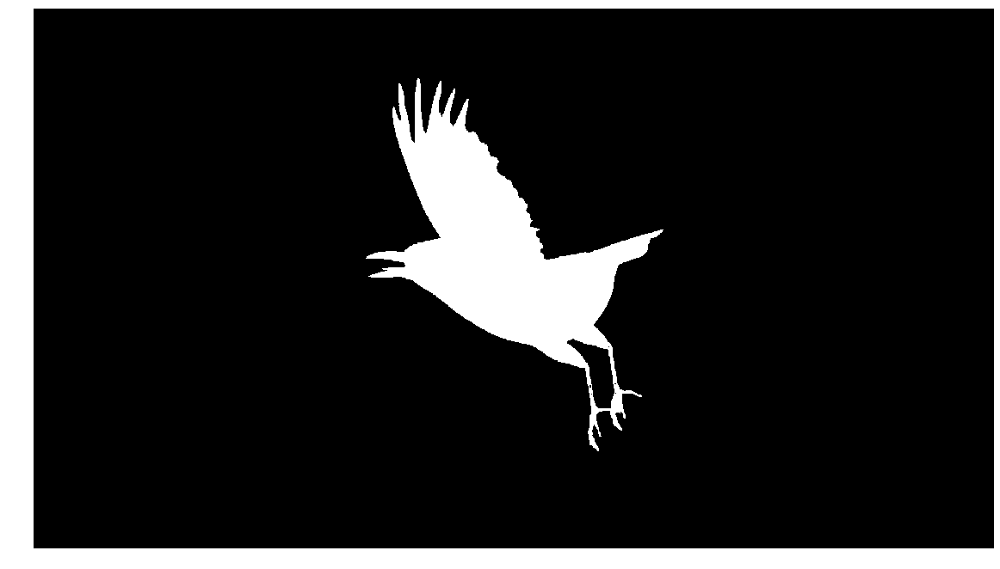

In [8]:
def busca_verde(im,hue_min=40,hue_max=75,sat_min=60,light_min=50):
    im_hsv = cv2.cvtColor(im, cv2.COLOR_BGR2HSV)

    eh_verde = (im_hsv[:,:,0] > hue_min) & (im_hsv[:,:,0] < hue_max)
    bem_saturado = (im_hsv[:,:,1] > sat_min)
    bem_claro = (im_hsv[:,:,2]>light_min) 

    mascara = eh_verde * bem_saturado * bem_claro
    mascara = 1 - mascara
    
    #kernel = np.ones((5,5),np.uint8)
    #mascara = cv2.morphologyEx(np.uint8(mascara), cv2.MORPH_CLOSE, kernel)
    
    return mascara

mascara = busca_verde(im)
imshow(mascara, True)

### Remove Fundo

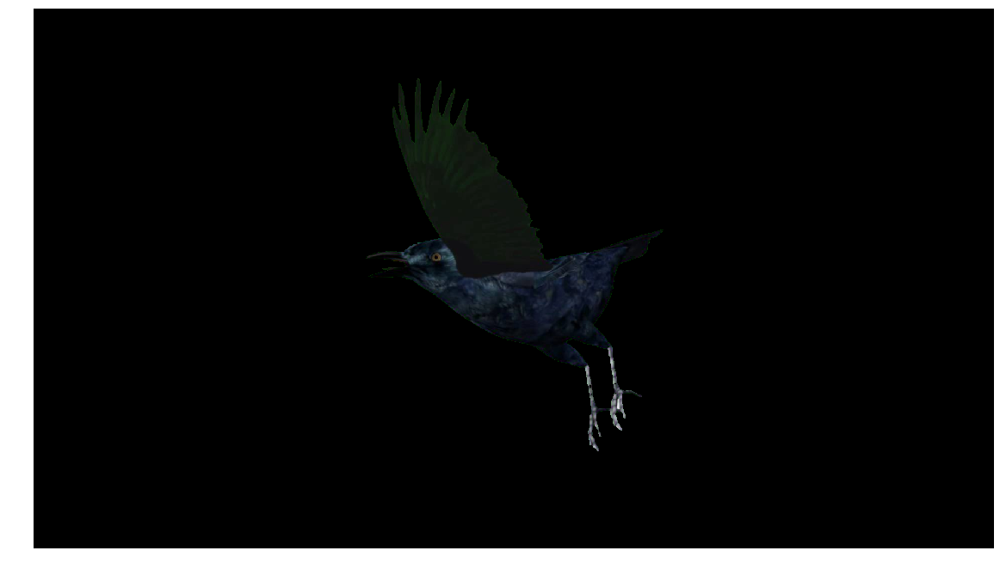

In [9]:
def remove_fundo(im,mascara):
    im_hsv = cv2.cvtColor(im, cv2.COLOR_BGR2HSV)

    im_hsv[:,:,2] = im_hsv[:,:,2] * mascara

    im_sem_fundo = cv2.cvtColor(im_hsv, cv2.COLOR_HSV2BGR)
    return im_sem_fundo
im_sem_fundo = remove_fundo(im,mascara)                      
imshow(im_sem_fundo, True)

### Suaviza bordas verdes

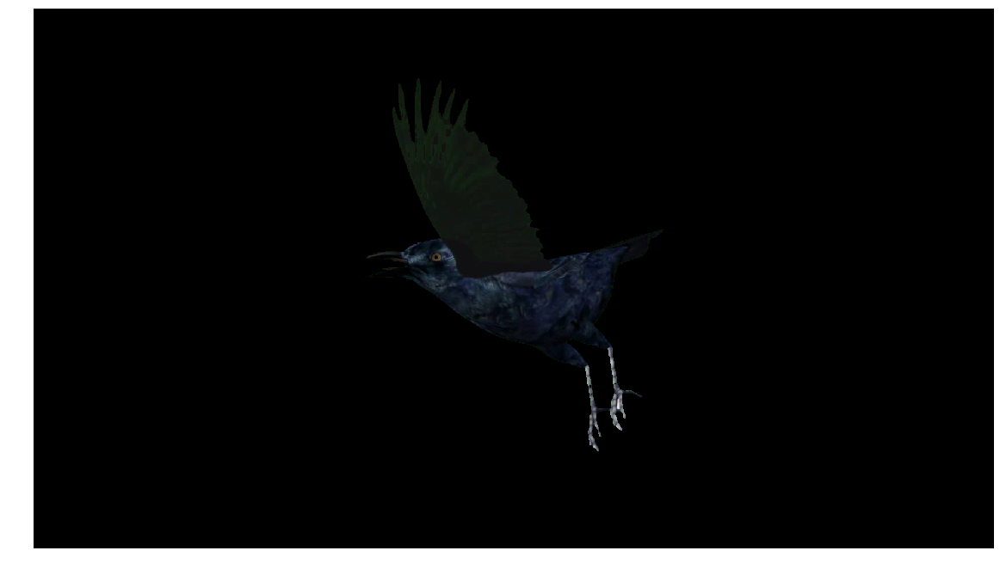

In [10]:
'''def ajusta_bordas(im,im_sem_fundo,mascara,hue_min=35,hue_max=80,sat_min=40,light_min=70):
    mascara2 = busca_verde(im,hue_min=hue_min,hue_max=hue_max,
                           sat_min=sat_min,light_min=light_min)
    mascara_borda = 1-(mascara-mascara2) #parte meio verde
    
    #imagem com menos verde
    im_menos_verde = im_sem_fundo.copy()
    im_menos_verde[:,:,1] = im_menos_verde[:,:,1]/2
    
    #somente onde é meio verde
    im_menos_verde_borda = coloca_fundo(im_sem_fundo,im_menos_verde,mascara_borda)
    return im_menos_verde_borda'''

def ajusta_bordas(im,im_sem_fundo,mascara,hue_min=35,hue_max=100,sat_min=100,light_min=35):
    im_hsv = cv2.cvtColor(im_sem_fundo, cv2.COLOR_BGR2HSV)
    im_hsv[:,:,2].mean()
    mascara2 = busca_verde(im,hue_min=hue_min,hue_max=hue_max,
                               sat_min=sat_min,light_min=light_min)
    mascara_borda = mascara != mascara2 #parte meio verde
    im_menos_verde = im_sem_fundo.copy()
    
    im_menos_verde[:,:,1] = np.where(mascara_borda, im_menos_verde[:,:,1] / 2, im_menos_verde[:,:,1])
    
    return im_menos_verde
    
meio_verde = ajusta_bordas(im,im_sem_fundo, mascara)
imshow(meio_verde,True)

### Desenha sombras na imagem de fundo

251.9765051561013 105.64605034722223


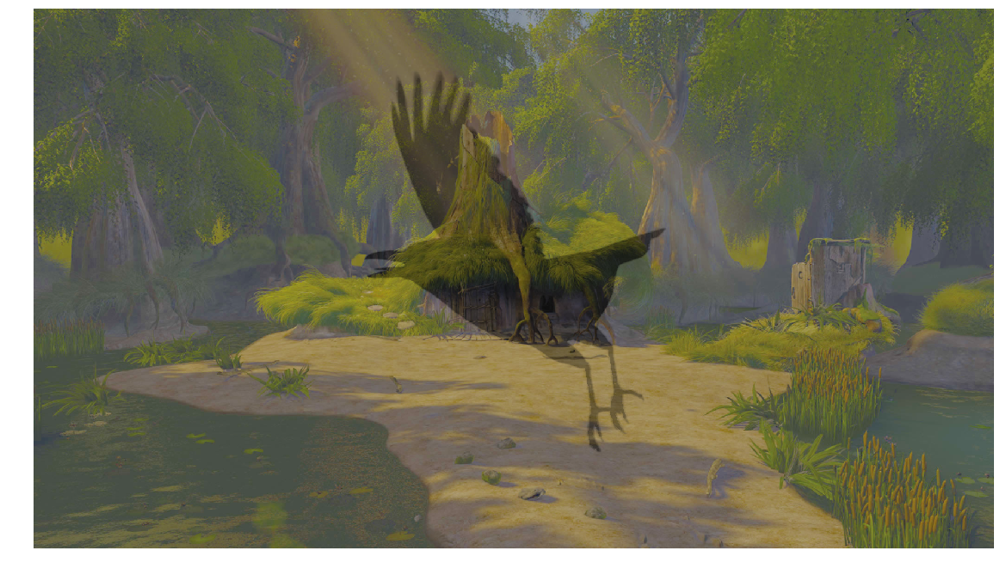

In [11]:
def sombras_fundo(im,im_fundo,mascara,alpha=0.5):
    '''im_verde = remove_fundo(im,1-mascara)

    im_hsv_verde = cv2.cvtColor(im_verde, cv2.COLOR_BGR2HSV)
    im_hsv_fundo = cv2.cvtColor(im_fundo, cv2.COLOR_BGR2HSV)
    lum_verde = im_hsv_verde[:,:,2]
    lum_fundo = im_hsv_fundo[:,:,2]

    media_verde = lum_verde[lum_verde!=0].mean()
    media_fundo = lum_fundo.mean()

    luminancia_relativa = np.where(lum_verde!=0, lum_verde - media_verde, 0)
    luminancia_relativa = luminancia_relativa * media_fundo / media_verde
    luminancia_fundo_ajustada = lum_fundo + luminancia_relativa
    luminancia_fundo_ajustada[luminancia_fundo_ajustada < 0] = 0
    luminancia_fundo_ajustada[luminancia_fundo_ajustada > 255] = 255

    im_hsv_fundo[:,:,2] = np.where(lum_verde!=0, luminancia_fundo_ajustada, 0)
    im_fundo_ajustado = cv2.cvtColor(im_hsv_fundo, cv2.COLOR_HSV2BGR)
    
    return im_fundo_ajustado'''
    
    im_verde = remove_fundo(im,1-mascara)
    
    im_hsv_verde = cv2.cvtColor(im_verde, cv2.COLOR_BGR2HSV)
    im_hsv_fundo = cv2.cvtColor(im_fundo, cv2.COLOR_BGR2HSV)
    
    # ajustando a luminosidade do verde para ser parecida com a da imagem de fundo
    lum_verde = im_hsv_verde[:,:,2]
    lum_fundo = im_hsv_fundo[:,:,2]
    media_verde = lum_verde[lum_verde!=0].mean() 
    media_fundo = lum_fundo.mean()
    lum_verde = lum_verde*(media_fundo/media_verde)
    
    print(media_verde,media_fundo)
    
    #soma ponderada 
    im_hsv_fundo[:,:,2] = lum_verde*alpha+lum_fundo*(1-alpha)
    
    im_fundo_ajustado = cv2.cvtColor(im_hsv_fundo, cv2.COLOR_HSV2BGR)
    
    return im_fundo_ajustado

im_fundo2 = sombras_fundo(im,im_fundo,mascara)
imshow(im_fundo2,True)

### Coloca fundo

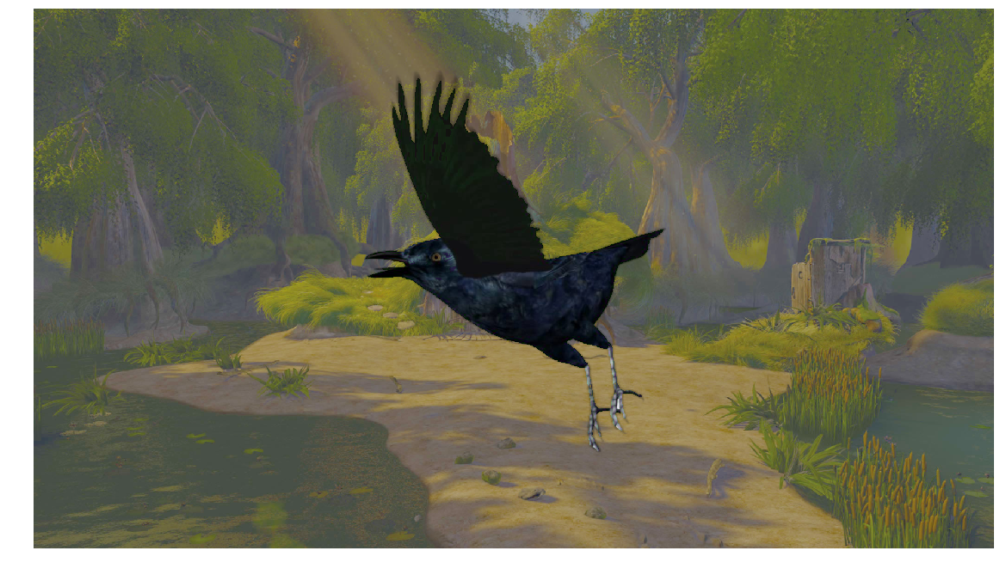

In [12]:
imagem_com_fundo = coloca_fundo(meio_verde,im_fundo2,mascara)
imshow(imagem_com_fundo, True)

### 5. Pipeline

In [13]:
ajuste_bordas = True
com_sombras = True

In [14]:
def pipeline(path,background):
    im           = cv2.imread(path)
    im_fundo     = abre_fundo(background,im.shape)
    mascara      = busca_verde(im)
    im_sem_fundo = remove_fundo(im,mascara)
    
    if ajuste_bordas:
        menos_bordas = ajusta_bordas(im,im_sem_fundo,mascara)
    else:
        menos_bordas = im_sem_fundo.copy()
    
    if com_sombras:
        im_fundo2 = sombras_fundo(im,im_fundo,mascara)
    else:
        im_fundo2 = im_fundo.copy()
        
    im_com_fundo = coloca_fundo(menos_bordas,im_fundo2,mascara)
    return im_com_fundo

In [15]:
folder = 'img/'
paths = ['0.bmp','1.bmp','2.bmp','3.bmp','4.bmp','5.bmp','6.bmp','7.bmp','8.bmp']
background = 'shrek.jpg'

0.bmp
225.39279868151178 105.63918650793651


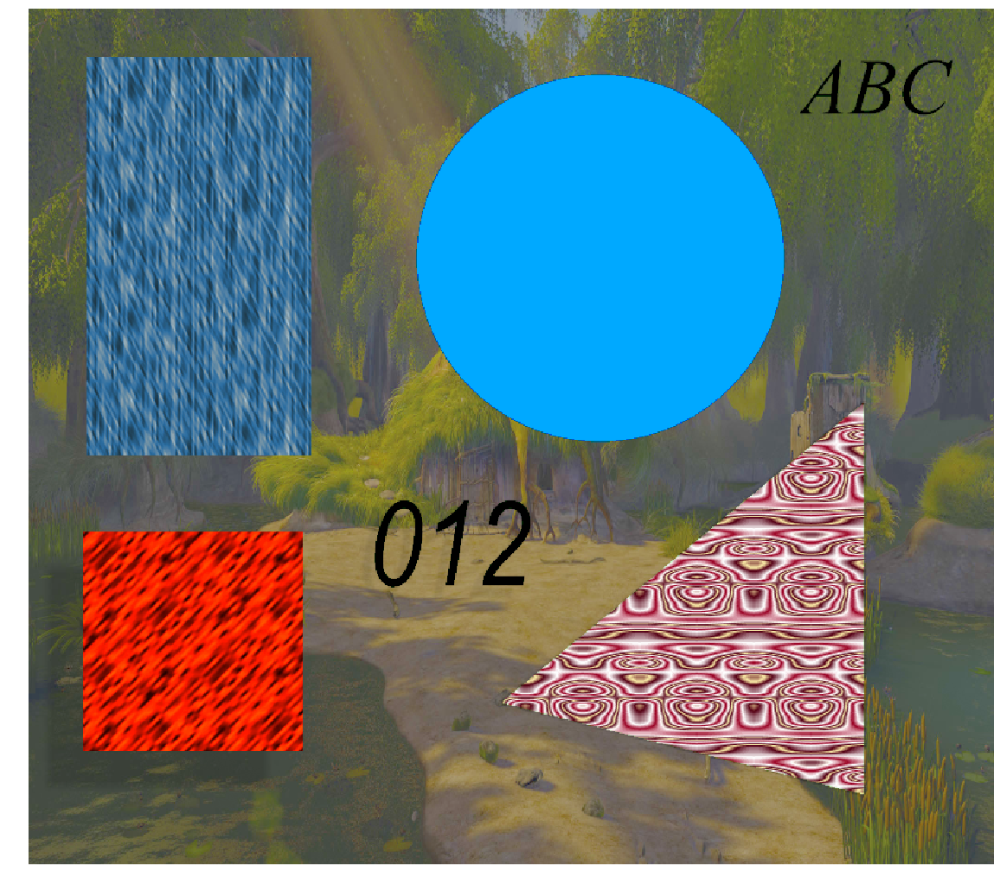

1.bmp
251.9765051561013 105.64605034722223


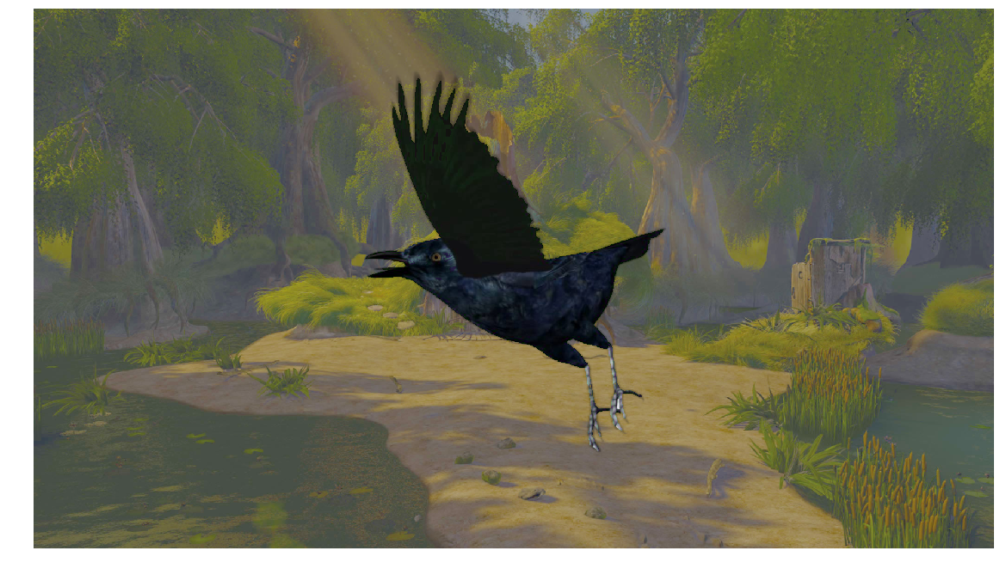

2.bmp
204.59756656709976 105.65016383020344


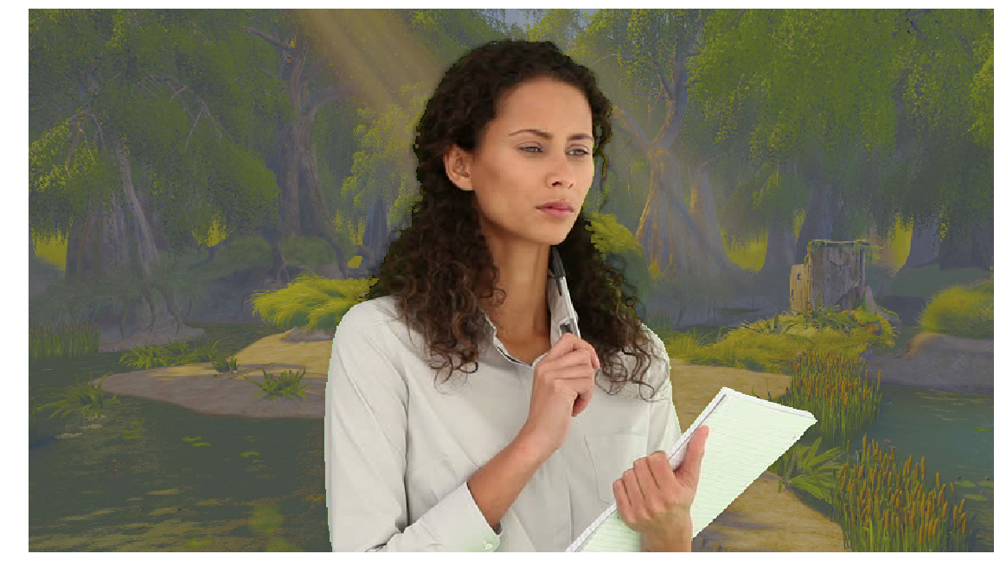

3.bmp
204.56158427754548 105.64605034722223


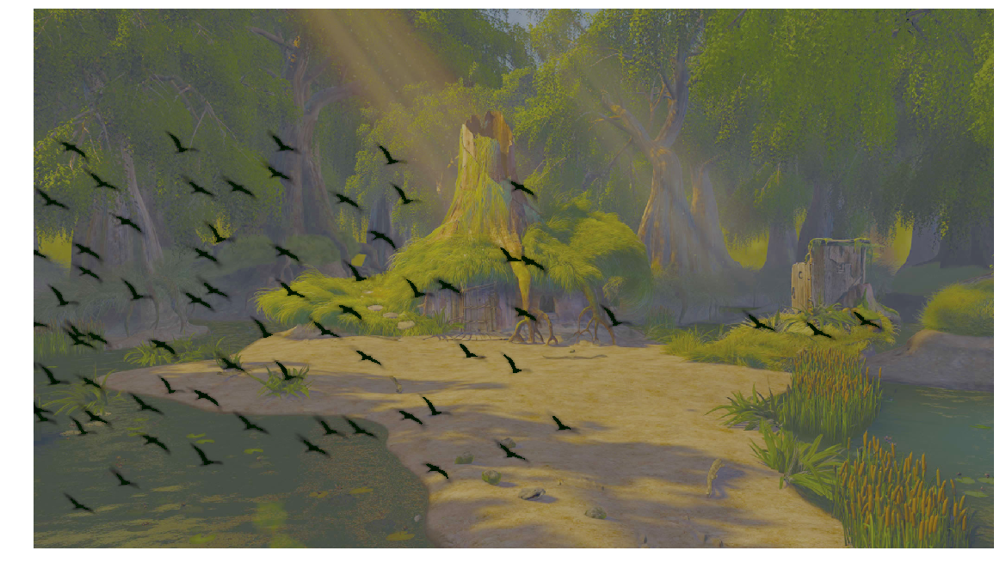

4.bmp
169.1073412043047 105.6438880012849


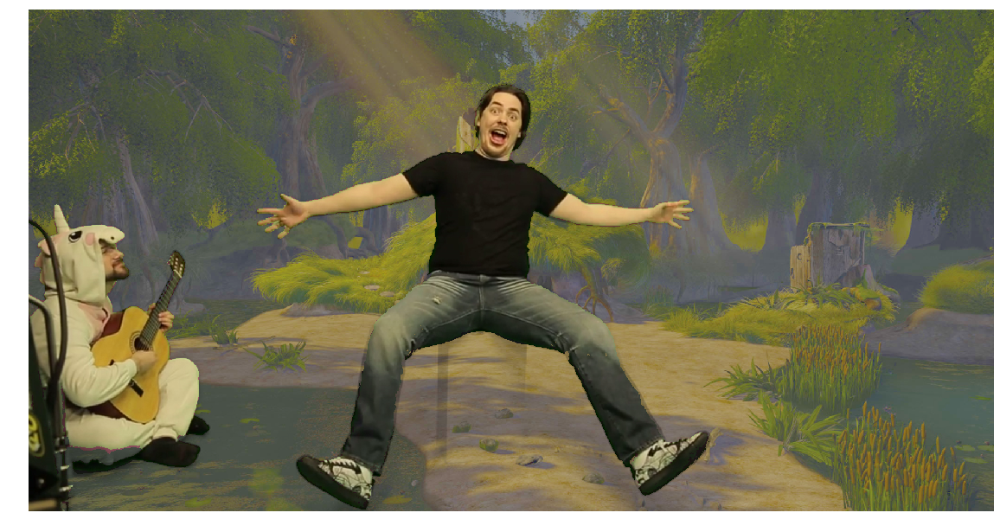

5.bmp
146.68958845142075 105.64574391534391


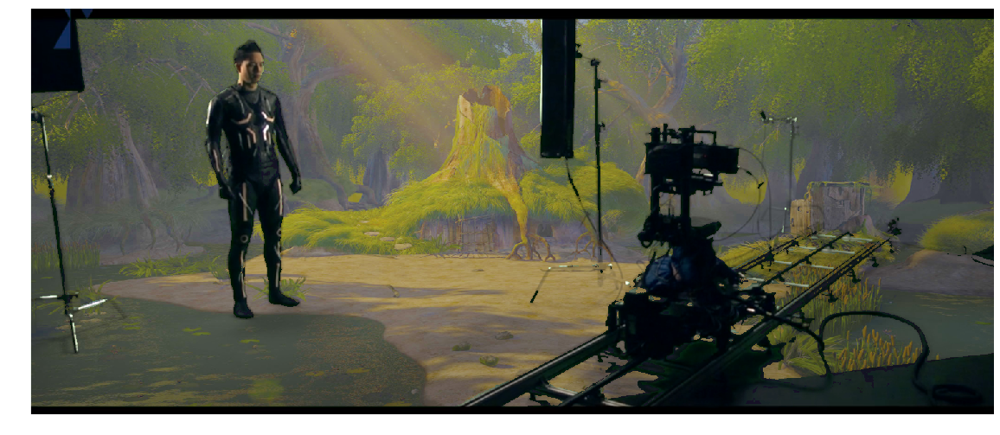

6.bmp
206.11077028749935 105.64390733506944


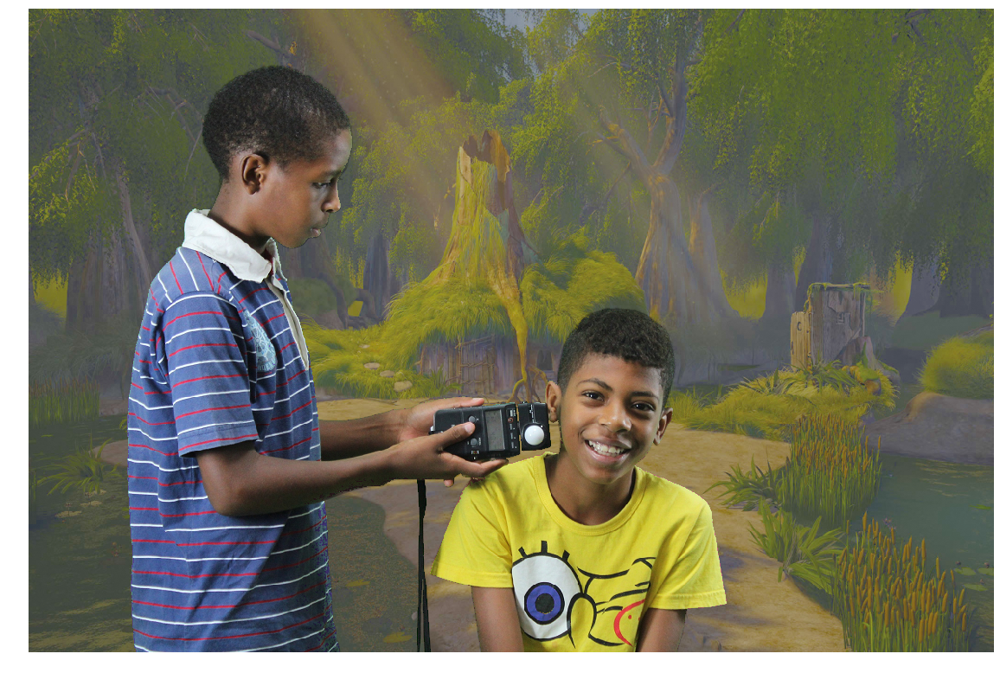

7.bmp
184.9838954945039 105.65093761455279


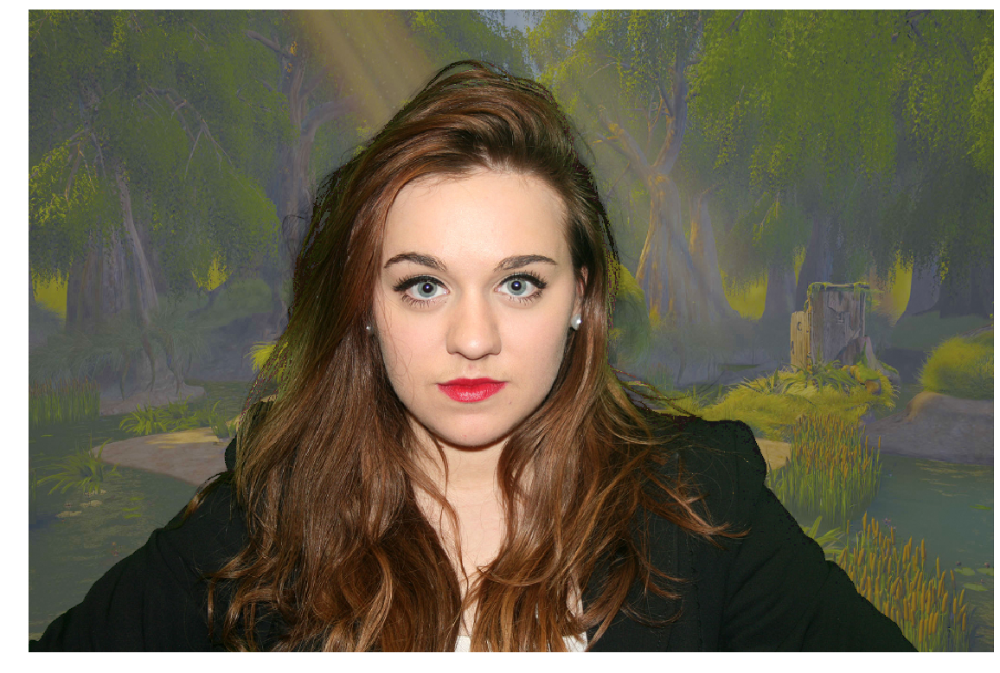

8.bmp
211.08758154225686 105.6434134810711


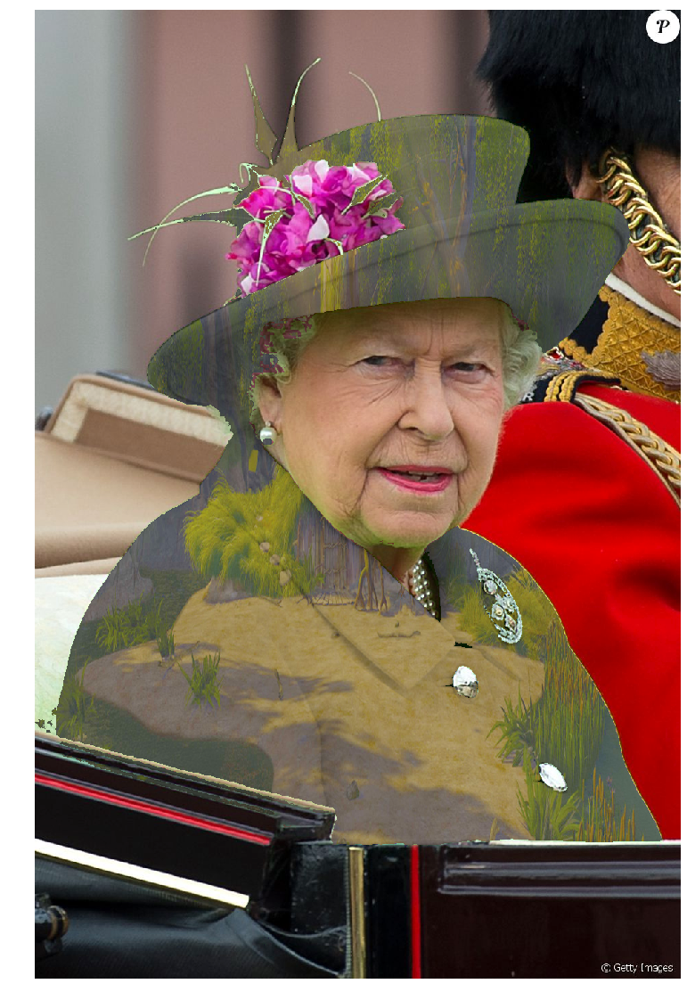

In [16]:
for p in paths:
    print(p)
    im_out = pipeline(folder+p,background)
    imshow(im_out,True)
    cv2.imwrite("img_out/"+p,im_out)